In [19]:
import os
from PIL import ImageFile, Image


ImageFile.LOAD_TRUNCATED_IMAGES = True
Image.MAX_IMAGE_PIXELS = None

if hasattr(os, 'add_dll_directory'):
    with os.add_dll_directory(r'C:\Users\junjianli\anaconda3\envs\reseach\Library\openslide\bin'):
        import openslide
else:
    import openslide

In [20]:
svs_path = r'G:\data\CAMELYON16\training\tumor'
wsi = openslide.open_slide(os.path.join(svs_path, 'tumor_001.tif'))

In [21]:
# 获取WSI的分辨率
level_count = wsi.level_count
for level in range(level_count):
    print("Level {}: Dimensions: {}, Downsample: {}".format(level, wsi.level_dimensions[level], wsi.level_downsamples[level]))

Level 0: Dimensions: (97792, 221184), Downsample: 1.0
Level 1: Dimensions: (48896, 110592), Downsample: 2.0
Level 2: Dimensions: (24448, 55296), Downsample: 4.0
Level 3: Dimensions: (12224, 27648), Downsample: 8.0
Level 4: Dimensions: (6112, 13824), Downsample: 16.0
Level 5: Dimensions: (3056, 6912), Downsample: 32.0
Level 6: Dimensions: (1528, 3456), Downsample: 64.0
Level 7: Dimensions: (764, 1728), Downsample: 128.0
Level 8: Dimensions: (382, 864), Downsample: 256.0
Level 9: Dimensions: (191, 432), Downsample: 512.0


In [31]:
# 获取最佳级别
# best_level = wsi.get_best_level_for_downsample(20)

# print(best_level)
# # 获取该级别的下采样率
downsample = wsi.level_downsamples[1]

# 计算实际倍率
magnification = 20 / downsample

print('Magnification:', magnification)

Magnification: 10.0


In [17]:
for k, v in dict(wsi.properties).items():
    print(k, v)

openslide.level-count 10
openslide.level[0].downsample 1
openslide.level[0].height 221184
openslide.level[0].tile-height 512
openslide.level[0].tile-width 512
openslide.level[0].width 97792
openslide.level[1].downsample 2
openslide.level[1].height 110592
openslide.level[1].tile-height 512
openslide.level[1].tile-width 512
openslide.level[1].width 48896
openslide.level[2].downsample 4
openslide.level[2].height 55296
openslide.level[2].tile-height 512
openslide.level[2].tile-width 512
openslide.level[2].width 24448
openslide.level[3].downsample 8
openslide.level[3].height 27648
openslide.level[3].tile-height 512
openslide.level[3].tile-width 512
openslide.level[3].width 12224
openslide.level[4].downsample 16
openslide.level[4].height 13824
openslide.level[4].tile-height 512
openslide.level[4].tile-width 512
openslide.level[4].width 6112
openslide.level[5].downsample 32
openslide.level[5].height 6912
openslide.level[5].tile-height 512
openslide.level[5].tile-width 512
openslide.level[5].w

In [6]:
best_level = wsi.get_best_level_for_downsample(64)
best_level

2

In [18]:
for i in range(3):
    print(wsi.level_dimensions[i])

(97792, 221184)
(48896, 110592)
(24448, 55296)


In [76]:
w, h = wsi.dimensions

In [77]:
w, h

(69930, 41240)

In [60]:
downsamples = wsi.level_downsamples
downsamples

(1.0,
 4.000057201693171,
 16.002696357231592,
 64.03786430960344,
 256.15145723841374,
 1029.6911764705883,
 4118.764705882353)

In [61]:
help(wsi.get_thumbnail)

Help on method get_thumbnail in module openslide:

get_thumbnail(size) method of openslide.OpenSlide instance
    Return a PIL.Image containing an RGB thumbnail of the image.
    
    size:     the maximum size of the thumbnail.



In [79]:
# size(tuple)
thumb = wsi.get_thumbnail(size=wsi.level_dimensions[2])


In [85]:
import numpy as np
np.array(thumb).shape

(2577, 4370, 3)

In [68]:
wsi.level_count


7

In [69]:
type(thumb)

PIL.Image.Image

In [70]:
# thumb

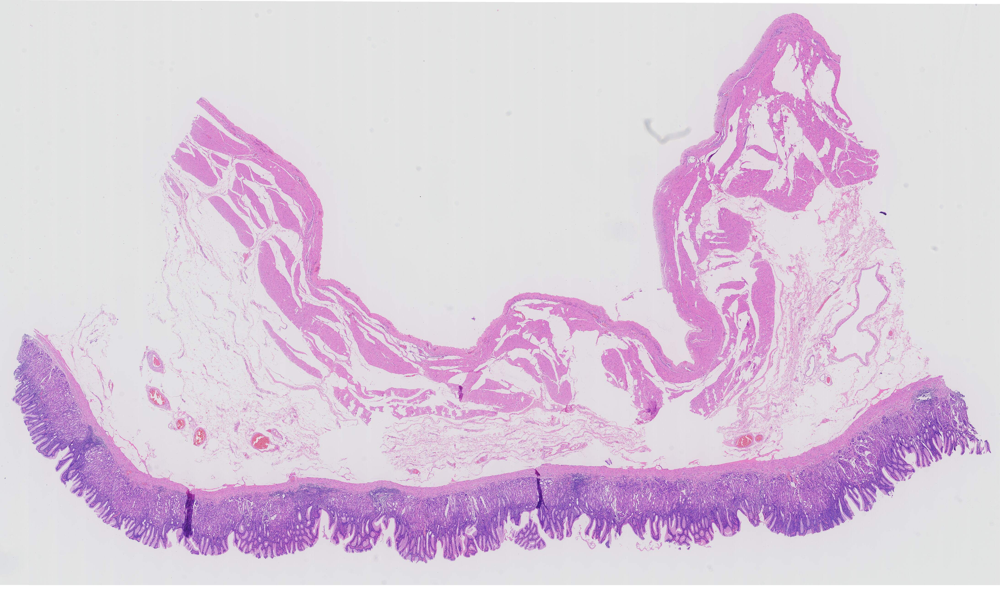

In [71]:
thumb